In [1]:
import sympy as sp
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation,rc
from mpl_toolkits.mplot3d import Axes3D


def ejes3d(x0,y0,z0,x1,y1,z1,ejes='x'):
    #fig=plt.figure(figsize=(8,6),dpi=80)
    #ax = plt.Axes(fig,[0.,0.,1.,1.])
    fig = plt.figure()
    ax = Axes3D(fig)
    #fig=plt.figure()
    #ax=fig.add_subplot(111,projection='3d')
    ax.set_xlim([x0,x1])
    ax.set_ylim([y0,y1])
    ax.set_zlim([z0,z1])
    ax.set_xlabel('$'+ejes+'_0$')
    ax.set_ylabel('$'+ejes+'_1$')
    ax.set_zlabel('$'+ejes+'_2$')
    punto3d(ax,(0,0,0),nombre=r'$\vec{0}$')

    return fig,ax

#def animacion_paso_3d(ax):
#    return lambda i: ax.view_init(elev=10., azim=i)

def dibujo():                           # En esta rutina se colocan los puntos y líneas para la animación
    return fig,    

def animacion_paso_3d(ax,fig,angulo):
    ax.view_init(elev=10., azim=angulo)
    return fig, 

def animacion3d(fig,ax,dibujo=dibujo, fps=10, segundos=1):
    plt.close(fig)
    rc('animation', html='jshtml')
    frames=fps*segundos
    return animation.FuncAnimation(fig, lambda i : animacion_paso_3d(ax,fig,i/frames*90), init_func=dibujo,
                               frames=frames, interval=int(1000/fps), blit=True)

def linea3d(ax,u,v=(0,0,0),color='k',**kwargs):
    ax.plot((u[0],v[0]),(u[1],v[1]),(u[2],v[2]),color)

def plano3d(ax,u,v,color='k',**kwargs):
    x_min,x_max=ax.get_xlim()
    y_min,y_max=ax.get_ylim()
    det=u[0]*v[1]-u[1]*v[0]
    kx=(v[1]*u[2]-u[1]*v[2])/det
    ky=-(v[0]*u[2]-u[0]*v[2])/det

    xx=[[x_min,x_max],[x_min,x_max]]
    yy=[[y_min,y_min],[y_max,y_max]]
    zz=np.array([[kx*x_min+ky*y_min,kx*x_max+ky*y_min],[kx*x_min+ky*y_max,kx*x_max+ky*y_max]]).astype(np.float64)

    ax.plot_surface(xx, yy, zz, alpha=0.2)
    #ax.scatter(u[0], u[1], u[2], color='green')
    #ax.scatter(v[0], v[1], v[2], color='green')

    
def punto3d(ax,v,nombre='',fontsize=15, c="goldenrod",**kwargs):
    ax.scatter(v[0],v[1],float(v[2]), marker='o', s=20, c="goldenrod", alpha=0.6)
    if nombre!='':
        ax.text(v[0],v[1],v[2],nombre,fontsize=fontsize)        

def p(v):
    return '('+', '.join([str(ai) for ai in v])+')\u1D57'#'\u209c'

In [2]:
import numpy as np
def dibuja(sombra,xmin=0.5,xmax=1.5,ymin=0.5,ymax=1.5):
    """
    Se define una rutina para dibujar los puntos de la sombra y los arcos
    
    Parameters
    ----------
    sombra : Lista de puntos de la sombra. Lista de listas de flotantes.
    """
    
    p=np.array(sombra.T)
    plt.scatter(*p.T,color='black')
    p1=[sombra[0],sombra[2],
        sombra[6],sombra[4],
        sombra[0],sombra[1],
        sombra[3],sombra[2],sombra[3],
        sombra[7],sombra[6],sombra[7],
        sombra[5],sombra[4],sombra[5],
        sombra[1]]
    p1=np.array(p1)
    l1=p1.transpose()
    plt.plot(l1[0],l1[1],color='black')
    plt.axis([xmin,xmax,ymin,ymax])
    return plt.show()

# Se dibuja la sombra
#dibuja(sombra)

# Universidad Distrital F. J. C.
## Facultad De Ingeniería
### Algebra Lineal
#### Gerardo Muñoz
gmunoz@udistrital.edu.co

<!-- # Mínimos cuadrados

Antes de remplazar los valores, voy despejar la respuesta. Para lo cual necesitamos las siguietes relaciones.

Como $A=\begin{bmatrix}\vec{v}_1 & \vec{v}_2\end{bmatrix}$ entonces $A^T=\begin{bmatrix}\vec{v}_1^T \\ \vec{v}_2^T\end{bmatrix}$ y por lo tanto 

$A^T A=\begin{bmatrix}\vec{v}_1^T \\ \vec{v}_2^T\end{bmatrix}\begin{bmatrix}\vec{v}_1 & \vec{v}_2\end{bmatrix}
=\begin{bmatrix}
\vec{v}_1 \cdot \vec{v}_1 & \vec{v}_1 \cdot \vec{v}_2 \\
\vec{v}_2 \cdot \vec{v}_1 & \vec{v}_2 \cdot \vec{v}_2 
\end{bmatrix}$

$A^T \vec{u}=\begin{bmatrix}\vec{v}_1^T \\ \vec{v}_2^T\end{bmatrix}\vec{u}
=\begin{bmatrix} \vec{v}_1 \cdot \vec{u}\\\vec{v}_2 \cdot \vec{u}\end{bmatrix}$




Sabemos que para encontrar las constantes $\vec{w}=\begin{pmatrix}k_1\\k_2\end{pmatrix}$ que determinan la ubicación de la proyección del vector $u$ sobre el plano generado por los vectores $ \vec{v}_1$ y $ \vec{v}_2$ hay que resolver el siguiente sistema de ecuaciones.

$( \vec{v}_1 \cdot \vec{v}_1)k_1+(\vec{v}_1 \cdot \vec{v}_2)k_2= \vec{v}_1 \cdot \vec{u}$

$( \vec{v}_2 \cdot \vec{v}_1)k_1+(\vec{v}_2 \cdot \vec{v}_2)k_2= \vec{v}_2 \cdot \vec{u}$

El cual equivale a

$\begin{bmatrix}
\vec{v}_1 \cdot \vec{v}_1 & \vec{v}_1 \cdot \vec{v}_2 \\
\vec{v}_2 \cdot \vec{v}_1 & \vec{v}_2 \cdot \vec{v}_2 
\end{bmatrix}
\begin{pmatrix}k_1\\k_2\end{pmatrix}
=\begin{bmatrix} \vec{v}_1 \cdot \vec{u}\\\vec{v}_2 \cdot \vec{u}\end{bmatrix}$


lo cual implica que 

$A^T A \vec{w} = A^T \vec{u}$

Cuando las columnas de $A$ son L.I., $A^T A$ es invertible y por lo tanto se pueden despejar las constantes.

$\vec{w} = (A^T A )^{-1}A^T \vec{u}$

Estos valores de $k_1$ y $k_2$ se conocen como la **solución por mínimos cuadrados** ya que minimiza la norma del vector ortogonal al espacio columna de $A$. Ademas, se puede generalizar a cualquier base $A$ de vectores de $\mathbb{R}^n$. -->

<!-- Además se puede generalizar para 
si $B=\begin{bmatrix}\vec{u}_1 & \vec{u}_2 & \vec{u}_3 & \vec{u}_4 & \vec{u}_5 & \vec{u}_6 \end{bmatrix}$ entonces
$\begin{bmatrix}k_{11} & k_{12} & k_{13} & k_{14} & k_{15} & k_{16}  \\k_{21} & k_{22} & k_{23} & k_{24} & k_{25} & k_{26}  \end{bmatrix} = (A^T A )^{-1}A^T B$
 -->

# Ejemplo de Proyección



In [16]:
import sympy as sp
u=sp.Matrix([[1],
             [1],
             [1]])
u


Matrix([
[1],
[1],
[1]])

In [18]:
v=sp.Matrix([[2],
             [2],
             [0]])
 
v

Matrix([
[2],
[2],
[0]])

In [20]:
u_pr = u.dot(v) / v.dot(v) * v
u_pr

Matrix([
[1],
[1],
[0]])

In [22]:
fps=20
segundos=2

fig,ax=ejes3d(-1,-1,-1,3,3,3) 

punto3d(ax,v,nombre=r'$\vec{v}$')  # Coloca el punto
#punto3d(ax,k1*v1,nombre=r'$k_1\vec{v}_1$')  # Coloca el punto
punto3d(ax,u,nombre=r'$\vec{u}$')  # Coloca el punto
punto3d(ax,u_pr,nombre=r'$\vec{u}_pr$')  # Coloca el punto
linea3d(ax,v)
#linea3d(ax,v2)
linea3d(ax,u)
linea3d(ax,u_pr)
#plano3d(ax,v1,v2)

animacion3d(fig,ax, fps=fps, segundos=segundos)  # Genera la animación para rotar  

<ipython-input-1-902ed738ffce>:12: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


In [23]:
u=sp.Matrix([1,2,3])
v=sp.Matrix([3,1,2])
u_pr = u.dot(v) / v.dot(v) * v

In [24]:
fps=20
segundos=2

fig,ax=ejes3d(-1,-1,-1,3,3,3) 

punto3d(ax,v,nombre=r'$\vec{v}$')  # Coloca el punto
#punto3d(ax,k1*v1,nombre=r'$k_1\vec{v}_1$')  # Coloca el punto
punto3d(ax,u,nombre=r'$\vec{u}$')  # Coloca el punto
punto3d(ax,u_pr,nombre=r'$\vec{u}_pr$')  # Coloca el punto
linea3d(ax,v)
#linea3d(ax,v2)
linea3d(ax,u)
linea3d(ax,u_pr)
#plano3d(ax,v1,v2)

animacion3d(fig,ax, fps=fps, segundos=segundos)  # Genera la animación para rotar  

<ipython-input-1-902ed738ffce>:12: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


In [23]:
u=sp.Matrix([3,1,2])
v=sp.Matrix([1,2,3])
u_pr = u.dot(v) / v.dot(v) * v

In [24]:
fps=20
segundos=2

fig,ax=ejes3d(-1,-1,-1,3,3,3) 

punto3d(ax,v,nombre=r'$\vec{v}$')  # Coloca el punto
#punto3d(ax,k1*v1,nombre=r'$k_1\vec{v}_1$')  # Coloca el punto
punto3d(ax,u,nombre=r'$\vec{u}$')  # Coloca el punto
punto3d(ax,u_pr,nombre=r'$\vec{u}_pr$')  # Coloca el punto
linea3d(ax,v)
#linea3d(ax,v2)
linea3d(ax,u)
linea3d(ax,u_pr)
#plano3d(ax,v1,v2)

animacion3d(fig,ax, fps=fps, segundos=segundos)  # Genera la animación para rotar  

<ipython-input-1-902ed738ffce>:12: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


# Ejemplo de mínimos cuadrados 

Sabemos que el siguiente sistema $[A:\vec{u}]$ es incosistente

$$\left[\begin{matrix}3 & 1 & : & 1\\1 & 1 & : & 3\\1 & 3 & : & 1\end{matrix}\right]
\sim \left[\begin{matrix}1 & 1 & : & 3\\3 & 1 & : & 1\\1 & 3 & : & 1\end{matrix}\right]
\sim \left[\begin{matrix}1 & 1 & : & 3\\0 & -2 & : & -8\\0 & 2 & : & -2\end{matrix}\right]
\sim \left[\begin{matrix}1 & 1 & : & 3\\0 & -2 & : & -8\\0 & 0 & : & -10\end{matrix}\right]
$$

Esto implica que el vector $\vec{u}$ no está en el espacio generado por las columnas de $A=\begin{bmatrix}\vec{v}_1 &
\vec{v}_2 \end{bmatrix}$.

In [3]:
import sympy as sp
v1=sp.Matrix([[3],
             [1],
             [1]])
 
v2=sp.Matrix([[1],
              [1],
              [3]])

u=sp.Matrix([[1],
             [3],
             [1]])

A=v1.row_join(v2)
A

Matrix([
[3, 1],
[1, 1],
[1, 3]])

In [4]:
fps=20
segundos=2

fig,ax=ejes3d(-1,-1,-1,3,3,3) 

punto3d(ax,v1,nombre=r'$\vec{v}_1$')  # Coloca el punto
#punto3d(ax,k1*v1,nombre=r'$k_1\vec{v}_1$')  # Coloca el punto
punto3d(ax,u,nombre=r'$\vec{u}$')  # Coloca el punto
punto3d(ax,v2,nombre=r'$\vec{v}_2$')  # Coloca el punto
linea3d(ax,v1)
#linea3d(ax,v2)
linea3d(ax,u)
linea3d(ax,v2)
plano3d(ax,v1,v2)


animacion3d(fig,ax, fps=fps, segundos=segundos)  # Genera la animación para rotar  

<ipython-input-1-902ed738ffce>:12: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


Encontramos el vector $\vec{w}$ usando **mínimos cuadrados**.
$$\vec{w} = (A^T A )^{-1}A^T \vec{u}$$

In [5]:
w = (A.T * A ).inv()* A.T * u

(k1,k2) = w

(k1,k2)

(7/18, 7/18)

In [6]:
u_proy=k1*v1+k2*v2
u_proy

Matrix([
[14/9],
[ 7/9],
[14/9]])

In [7]:
fps=20
segundos=2

fig,ax=ejes3d(-1,-1,-1,3,3,3) 

punto3d(ax,v1,nombre=r'$\vec{v}_1$')  # Coloca el punto
#punto3d(ax,k1*v1,nombre=r'$k_1\vec{v}_1$')  # Coloca el punto
punto3d(ax,u,nombre=r'$\vec{u}$')  # Coloca el punto
punto3d(ax,v2,nombre=r'$\vec{v}_2$')  # Coloca el punto
punto3d(ax,k1*v1,nombre=r'$k_{1}\vec{v}_1$')  # Coloca el punto
punto3d(ax,k2*v2,nombre=r'$k_{2}\vec{v}_2$')  # Coloca el punto
punto3d(ax,u_proy,nombre=r'$\vec{u}_{proy}$')  # Coloca el punto
linea3d(ax,v1)
#linea3d(ax,v2)
linea3d(ax,u)
linea3d(ax,k1*v1,u_proy)
linea3d(ax,k2*v2,u_proy)
linea3d(ax,v2)
plano3d(ax,v1,v2)


animacion3d(fig,ax, fps=fps, segundos=segundos)  # Genera la animación para rotar  

<ipython-input-1-902ed738ffce>:12: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


$U_{proy}=k_1\vec{v}_1+k_2\vec{v}_2=\begin{bmatrix}\vec{v}_1 & \vec{v}_2 \end{bmatrix}\begin{pmatrix}k_1 \\ k_2 \end{pmatrix}=A\vec{w}$

Para encontrar los pesos de una red neuronal lineal es más sencillo utilizar los mímios cuadrados que el algoritmo de sustitución hacia atras. Sin embargo, en general las redes neuronales artificiales no son lineales y por lo tanto no se pueden encontrar los pesos con minimos cuadrados, es por eso que en esos casos sí se utiliza el algoritmo de sustitución hacia atras.  

# Regresión Lineal

Vamos a usar mínimos cuadrados para encontrar una recta $mx+b=y$ en $\mathbb{R}^2$ que pase lo más cerca de unos puntos. Por ejemplo, los siguentes 5 puntos. 

In [8]:
P=sp.Matrix([[1,  1.5, 2.5, 3.5,  4 ],
             [2,  4,   5,   6,    8 ]
             ])
P

Matrix([
[1, 1.5, 2.5, 3.5, 4],
[2,   4,   5,   6, 8]])

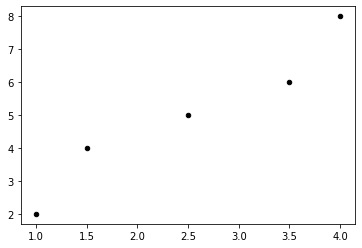

In [9]:
fig,ax=plt.subplots()
ax.scatter(*np.array(P) ,s=20,color='k')
plt.show()

Al remplazar cada punto en la ecuación $mx+b=y$ obtenemos 5 ecuaciones homogenenas, cuya matriz extendida es: 

In [10]:
M=((P.T)[:,0]).row_join(sp.ones(5,1)).row_join((P.T)[:,1])
M

Matrix([
[  1, 1, 2],
[1.5, 1, 4],
[2.5, 1, 5],
[3.5, 1, 6],
[  4, 1, 8]])

In [11]:
A=M[:,:-1]
A

Matrix([
[  1, 1],
[1.5, 1],
[2.5, 1],
[3.5, 1],
[  4, 1]])

In [12]:
u=M[:,-1]
u

Matrix([
[2],
[4],
[5],
[6],
[8]])

In [13]:
w=(A.T*A).inv()*A.T*u
m,b=w
m,b

(1.69230769230769, 0.769230769230770)

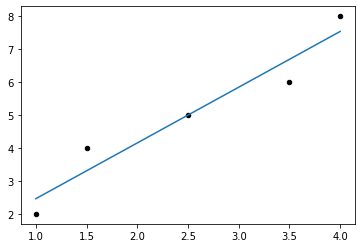

In [14]:
fig,ax=plt.subplots()
ax.scatter(*np.array(P) ,s=20,color='k')
X=[1,4]
Y=[m*x+b for x in X]
ax.plot(X,Y)    
plt.show()